In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
import seaborn as sns

# **Available activation functions**

In [2]:
def sigmoid(x):
    return 1 / (1 + np.exp(-x))

def sigmoid_derivative(x):
    return x * (1 - x)

def linear(x):
    return x

def linear_derivative(x):
    return np.ones_like(x)

def relu(x):
    return np.maximum(0, x)

def relu_derivative(x):
    return np.where(x > 0, 1, 0)

def tanh(x):
    return np.tanh(x)

def tanh_derivative(x):
    return 1 - x**2

def softmax(x):
    return np.exp(x) / np.sum(np.exp(x), axis=1, keepdims=True)

# **Single layer definition**

In [4]:
class Layer:
    
    def __init__(self, input_dim, output_dim, activation='sigmoid', weights_init='uniform'):
        """
        Initializes a single layer in the neural network.

        Parameters:
        - input_dim (int): Number of input neurons (features).
        - output_dim (int): Number of output neurons.
        - activation (str, optional): Activation function to use ('sigmoid' by default). 
          Supported: 'sigmoid', 'linear', 'relu', 'tanh', 'softmax'.
        - weights_init (str, optional): Weight initialization method ('uniform' by default).
          Available methods:
            - 'uniform' : Weights initialized from a uniform distribution.
            - 'normal'  : Weights initialized from a normal distribution.
            - 'xavier'  : Xavier/Glorot initialization (good for tanh).
            - 'he'      : He initialization (good for ReLU).

        Raises:
        - ValueError: If an unknown weight initialization method or activation function is provided.
        """
        
        weight_initializers = {
            'uniform': lambda: np.random.uniform(0, 1, size=(input_dim, output_dim)),
            'normal': lambda: np.random.randn(input_dim, output_dim),  
            'xavier': lambda: np.random.randn(input_dim, output_dim) * np.sqrt(2 / (input_dim + output_dim)),
            'he': lambda: np.random.randn(input_dim, output_dim) * np.sqrt(2 / input_dim) 
        }

        if weights_init not in weight_initializers:
            raise ValueError(f"Unknown initialization method: {weights_init}. Available: {list(weight_initializers.keys())}")

        self.weights = weight_initializers[weights_init]()
        self.biases = np.zeros((1, output_dim))
        
        activation_functions = {
            'sigmoid' : sigmoid,
            'linear' : linear,
            'relu' : relu,
            'tanh' : tanh,
            'softmax' : softmax
        }
        
        activation_derivatives = {  
            'sigmoid': sigmoid_derivative,
            'linear': linear_derivative,
            'relu' : relu_derivative,
            'tanh' : tanh_derivative
        }

        self.activation = activation_functions.get(activation)
        self.activation_derivative = activation_derivatives.get(activation)
        
        if self.activation is None:
            raise ValueError(f"Unknown activation function: {activation}. Available: {list(activation_functions.keys())}")

        
    def forward(self, X):
        """
        Performs forward propagation through the layer.

        Parameters:
        - X (numpy array): Input data (shape: number of samples × input features).

        Returns:
        - numpy array: Activated output of the layer.
        """
        return self.activation(np.dot(X, self.weights) + self.biases)


# **MLP - classification**

In [22]:
class MLP:
    
    def __init__(self, layers, weights_init='uniform', classification=False):
        """
        Initializes the multi-layer perceptron (MLP).
        
        Parameters:
        - layers (list of dicts): Each dictionary defines a Layer object with keys:
            - 'input_dim' (int): Number of input neurons.
            - 'output_dim' (int): Number of output neurons.
            - 'activation' (str): Activation function name.
        - weights_init (str, optional): Method for weight initialization ('uniform' by default).
        """
        self.layers = [Layer(layer['input_dim'], layer['output_dim'], layer['activation'], weights_init) for layer in layers]
        self.classification = classification
        self.weights_history = []


    def feedforward(self, X):
        """
        Performs forward propagation through the network.
        
        Parameters:
        - X (numpy array): Input data (shape: number of samples × input features).

        Returns:
        - activations (list of numpy arrays): Activations of each layer including input and output.
        """
        activations = [X]
        for i, layer in enumerate(self.layers):
            activations.append(layer.forward(activations[i]))
        return activations


    def predict(self, X):
        """
        Computes the network's output for given input data.
        
        Parameters:
        - X (numpy array): Input data.

        Returns:
        - numpy array: The final network output (predicted values).
        """
        if self.classification:
            preds = np.array(self.feedforward(X)[-1])
            return np.argmax(preds, axis=1).flatten()
        return np.array(self.feedforward(X)[-1]).reshape(-1,)


    def train(self, 
        X_train, 
        y_train, 
        epochs=500, 
        learning_rate=0.1, 
        batch_size=None,
        optimizer=None, 
        beta=0.9,  
        epsilon=1e-8 
        ):
        """
        Trains the neural network using mini-batch gradient descent and backpropagation.

        Parameters:
        - X_train (numpy array): Training input data.
        - y_train (numpy array): Training target values.
        - epochs (int, optional): Number of training iterations (default is 500).
        - learning_rate (float, optional): Step size for weight updates (default is 0.1).
        - batch_size (int, optional): Number of samples per batch. If None, full-batch is used.
        - optimizer (str, optional): 'momentum' or 'rmsprop' to apply these optimizers. Default is None.
        - beta (float, optional): Momentum and RMSProp smoothing constant. Default is 0.9.
        - epsilon (float, optional): Small constant for numerical stability in RMSProp. Default is 1e-8.

        Returns:
        - None (prints training progress and plots weight evolution).
        """
        X_train = np.array(X_train)
        y_train = np.array(y_train)
        loss = []
        self.weights_history = []

        if batch_size is None:
            batch_size = len(X_train)
            
        if self.classification:
            y_train_oh = self.one_hot_encode(y_train)

        if optimizer == 'momentum':
            velocity_w = [np.zeros_like(layer.weights) for layer in self.layers]
            velocity_b = [np.zeros_like(layer.biases) for layer in self.layers]
        elif optimizer == 'rmsprop':
            caches_w = [np.zeros_like(layer.weights) for layer in self.layers]
            caches_b = [np.zeros_like(layer.biases) for layer in self.layers]

        for epoch in range(epochs):
            indices = np.arange(len(X_train))
            np.random.shuffle(indices)

            for i in range(0, len(X_train), batch_size):
                batch_indices = indices[i:i + batch_size]
                X_batch = X_train[batch_indices]
                y_batch = y_train[batch_indices].reshape(-1, 1) if not self.classification else y_train_oh[batch_indices]

                weights_error = [np.zeros_like(layer.weights) for layer in self.layers]
                biases_error = [np.zeros_like(layer.biases) for layer in self.layers]

                activations = self.feedforward(X_batch)

                weights_error, biases_error = self.backpropagate(activations, y_batch)

                for j, layer in enumerate(self.layers):
                    if optimizer == 'momentum':
                        velocity_w[j] = beta * velocity_w[j] + learning_rate * weights_error[j]
                        layer.weights -= velocity_w[j]
                        velocity_b[j] = beta * velocity_b[j] + learning_rate * biases_error[j]
                        layer.biases -= velocity_b[j]
                    elif optimizer == 'rmsprop':
                        caches_w[j] = beta * caches_w[j] + (1 - beta) * np.square(weights_error[j])
                        layer.weights -= learning_rate * weights_error[j] / (np.sqrt(caches_w[j]) + epsilon)
                        caches_b[j] = beta * caches_b[j] + (1 - beta) * np.square(biases_error[j])
                        layer.biases -= learning_rate * biases_error[j] / (np.sqrt(caches_b[j]) + epsilon)
                    else:
                        layer.weights -= learning_rate * weights_error[j]
                        layer.biases -= learning_rate * biases_error[j]

            self.weights_history.append([layer.weights.copy() for layer in self.layers])

            if not self.classification:
                y_pred = self.predict(X_train)
                tmp_loss = self.mse(y_pred, y_train)   
                print(f"\nEpoch {epoch + 1}/{epochs}. Loss = {tmp_loss}.")
            else:
                y_pred_oh = self.feedforward(X_train)[-1]
                y_pred = np.argmax(y_pred_oh, axis=1).flatten() 
                tmp_loss = self.cross_entropy(y_train_oh, y_pred_oh)
                tmp_f1 = self.f1_score(y_train, y_pred)
                print(f"\nEpoch {epoch + 1}/{epochs}. Loss = {tmp_loss}. F1 Score = {tmp_f1}.")          
            loss.append(tmp_loss)

        plt.figure()
        plt.plot(range(epochs), loss, 'o')
        plt.show()
        self.plot_weights_evolution()


    def backpropagate(self, activations, y_batch):
        """
        Performs backpropagation to compute gradients for weight and bias updates.

        Parameters:
        - activations (list of numpy arrays): Activations from feedforward pass.
        - y_batch (numpy array): Expected output.

        Returns:
        - Tuple (weight_gradients, bias_gradients) where:
            - weight_gradients (list of numpy arrays): Gradients for each layer’s weights.
            - bias_gradients (list of numpy arrays): Gradients for each layer’s biases.
        """
        
        batch_size = y_batch.shape[0]

        if self.classification:
            y_pred = activations[-1]  
        else:
            y_pred = activations[-1].reshape(-1, 1)
        
        if self.classification:
            deltas = [(y_pred - y_batch).reshape(-1, y_pred.shape[1])]
        else:
            error = (y_pred - y_batch).reshape(-1, 1)
            deltas = [error * self.layers[-1].activation_derivative(y_pred)]

        for i in range(len(self.layers) - 2, -1, -1):
            layer = self.layers[i]
            next_layer = self.layers[i + 1]
            
            error = deltas[-1] @ next_layer.weights.T  
            deltas.append(error * layer.activation_derivative(activations[i + 1]))

        deltas.reverse() 

        weight_gradients = [(activations[i].T @ deltas[i]) / batch_size for i in range(len(self.layers))]
        bias_gradients = [np.mean(deltas[i], axis=0, keepdims=True) for i in range(len(self.layers))]

        return weight_gradients, bias_gradients
    
   
    def plot_weights_evolution(self):
        """
        Plots the evolution of weights over epochs for each layer.

        Returns:
        - None (displays plots).
        """
        epochs = len(self.weights_history)
        for layer_idx in range(len(self.layers)):
            weights_per_epoch = np.array([epoch[layer_idx] for epoch in self.weights_history])  
            
            num_weights = weights_per_epoch[0].size  
            weights_per_epoch = weights_per_epoch.reshape(epochs, num_weights)

            plt.figure(figsize=(8, 5))
            for w in range(num_weights):
                plt.plot(range(epochs), weights_per_epoch[:, w], alpha=0.7)

            plt.title(f'Weight Evolution in Layer {layer_idx + 1}')
            plt.xlabel('Epoch')
            plt.ylabel('Weight Value')
            plt.legend()
            plt.show()       
            
    def one_hot_encode(self, y, num_classes=None):
        """
        Converts class labels to one-hot encoding.

        Parameters:
        - y (numpy array): Class labels.

        Returns:
        - numpy array: One-hot encoded labels.
        """
        if num_classes is None:
            num_classes = len(np.unique(y))
            
        y = y.flatten()
        y = y.astype(int)
        y_oh = np.zeros((len(y), num_classes))
        y_oh[np.arange(len(y)), y] = 1
        return y_oh            

   
    def set_weights_and_biases(self, layer_idx, W, b):
        """
        Sets custom weights and biases for a specific layer.

        Parameters:
        - layer_idx (int): Index of the layer (0-based).
        - W (numpy array): New weight matrix for the layer.
        - b (numpy array): New bias vector for the layer.

        Returns:
        - None
        """
        self.layers[layer_idx].weights = W
        self.layers[layer_idx].biases = b


    def mse(self, y_true, y_pred):
        """
        Computes the Mean Squared Error (MSE) loss.

        Parameters:
        - y_true (numpy array): True target values.
        - y_pred (numpy array): Predicted values from the network.

        Returns:
        - float: Computed MSE loss.
        """
        return np.mean((y_true - y_pred) ** 2)
    
    
    def f1_score(self, y_true, y_pred):
        """
        Computes the F1-score for multi-class classification using macro-averaging.
        
        :param y_true: List or array of true class labels
        :param y_pred: List or array of predicted class labels
        :return: Macro-averaged F1-score value
        """
        classes = set(y_true) | set(y_pred)
        total_f1 = 0
        
        for cls in classes:
            tp = sum((yt == cls and yp == cls) for yt, yp in zip(y_true, y_pred))
            fp = sum((yt != cls and yp == cls) for yt, yp in zip(y_true, y_pred))
            fn = sum((yt == cls and yp != cls) for yt, yp in zip(y_true, y_pred))
            
            precision = tp / (tp + fp) if (tp + fp) > 0 else 0
            recall = tp / (tp + fn) if (tp + fn) > 0 else 0
            
            f1 = (2 * precision * recall) / (precision + recall) if (precision + recall) > 0 else 0
            total_f1 += f1
        
        return total_f1 / len(classes) if classes else 0

    def cross_entropy(self, y_true, y_pred):
        """
        Computes the cross-entropy loss for multi-class classification.

        Parameters:
        - y_true (numpy array): True target values (one-hot encoded).
        - y_pred (numpy array): Predicted probabilities from the network.

        Returns:
        - float: Computed cross-entropy loss.
        """
        epsilon = 1e-15  
        y_pred = np.clip(y_pred, epsilon, 1 - epsilon)  
        return -np.mean(np.sum(y_true * np.log(y_pred), axis=1))

## **rings3-regular dataset**


Epoch 1/20000. Loss = 1.2543181003058204. F1 Score = 0.2712000170076075.

Epoch 2/20000. Loss = 1.2283593995720559. F1 Score = 0.27121355034950717.

Epoch 3/20000. Loss = 1.2075664410431017. F1 Score = 0.27453677605175303.

Epoch 4/20000. Loss = 1.1891146696016515. F1 Score = 0.29253607183003555.

Epoch 5/20000. Loss = 1.1716308724853655. F1 Score = 0.33560280955390187.

Epoch 6/20000. Loss = 1.1550201951246526. F1 Score = 0.3800807455246075.

Epoch 7/20000. Loss = 1.1400053941486443. F1 Score = 0.39904123395534574.

Epoch 8/20000. Loss = 1.12669893158915. F1 Score = 0.39704677723545645.

Epoch 9/20000. Loss = 1.1148656907920789. F1 Score = 0.39625091458049694.

Epoch 10/20000. Loss = 1.1042638613956628. F1 Score = 0.39977862450056584.

Epoch 11/20000. Loss = 1.0946670451656686. F1 Score = 0.40058246496166555.

Epoch 12/20000. Loss = 1.0859599468569108. F1 Score = 0.39905647569088903.

Epoch 13/20000. Loss = 1.0779985305104582. F1 Score = 0.4061603382587657.

Epoch 14/20000. Loss = 1.

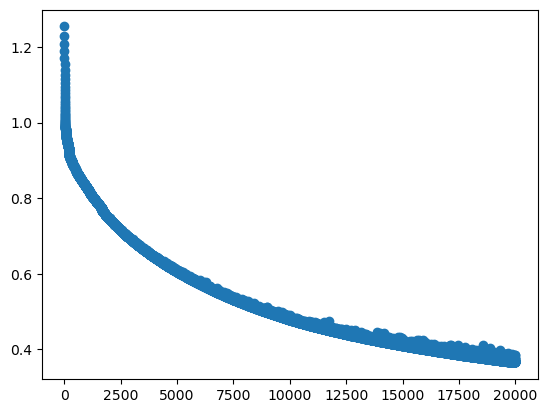

C:\Users\flang\AppData\Local\Temp\ipykernel_15008\3747954552.py:211: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


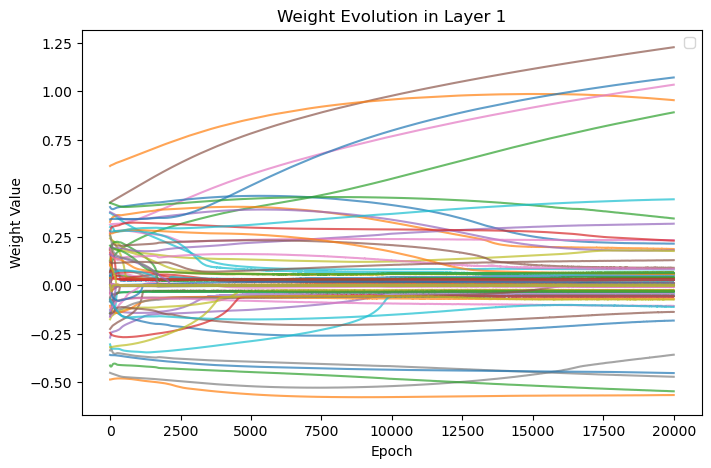

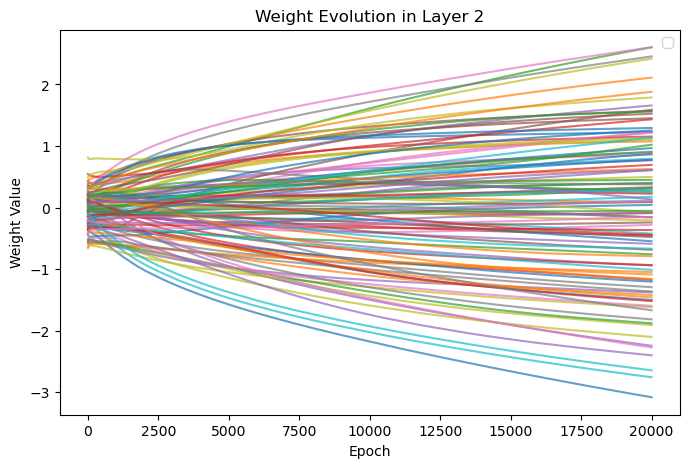

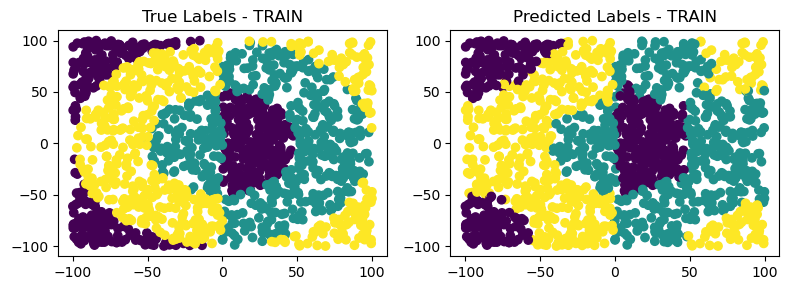

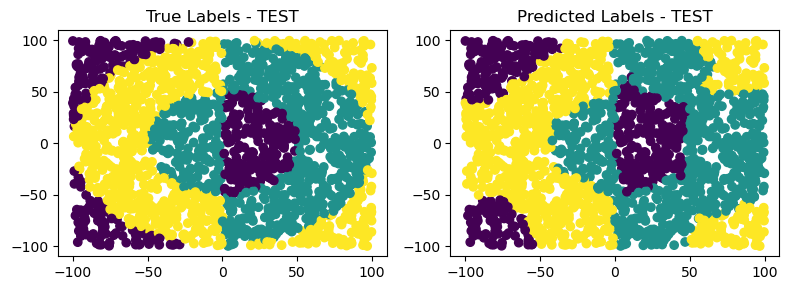

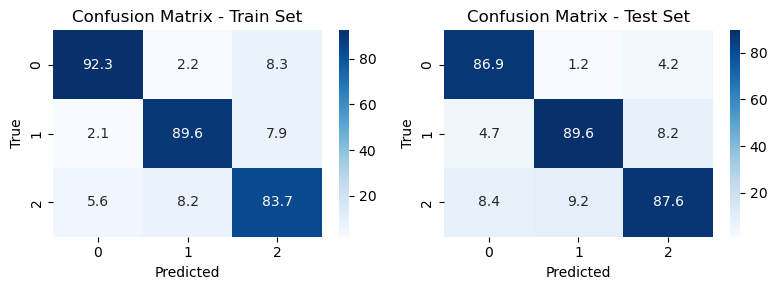

TRAIN F1-score: 0.884974281358482
TEST F1-score: 0.8827400828209058


In [10]:
np.random.seed(423)

rings3_regular_train = pd.read_csv('./data/classification/rings3-regular-training.csv')

X_train = rings3_regular_train.iloc[:, 0:(len(rings3_regular_train.iloc[1]) - 1)]
y_train = np.array(rings3_regular_train.iloc[:,-1])

rings3_regular_test = pd.read_csv('./data/classification/rings3-regular-test.csv')

X_test = rings3_regular_test.iloc[:, 0:(len(rings3_regular_test.iloc[1]) - 1)]
y_test = np.array(rings3_regular_test['c'])

NN = MLP(layers=[
    {'input_dim' : 2, 'output_dim' : 35, 'activation' : 'sigmoid'},
    {'input_dim' : 35, 'output_dim' : 3, 'activation' : 'softmax'}
], 
                   weights_init='xavier',
                   classification=True)

NN.train(X_train, y_train, epochs=20000, learning_rate=0.0004, batch_size = 30)

y_train_pred = NN.predict(X_train)

y_test_pred = NN.predict(X_test)

plt.figure(figsize=(8, 3))

plt.subplot(1, 2, 1)
plt.scatter(X_train.iloc[:, 0], X_train.iloc[:, 1], c=y_train)
plt.title("True Labels - TRAIN")

plt.subplot(1, 2, 2)
plt.scatter(X_train.iloc[:, 0], X_train.iloc[:, 1], c=y_train_pred)
plt.title("Predicted Labels - TRAIN")

plt.tight_layout()
plt.show()

plt.figure(figsize=(8, 3))

plt.subplot(1, 2, 1)
plt.scatter(X_test.iloc[:, 0], X_test.iloc[:, 1], c=y_test)
plt.title("True Labels - TEST")

plt.subplot(1, 2, 2)
plt.scatter(X_test.iloc[:, 0], X_test.iloc[:, 1], c=y_test_pred)
plt.title("Predicted Labels - TEST")

plt.tight_layout()
plt.show()


cm_train = confusion_matrix(y_train, y_train_pred, normalize='pred') * 100
cm_test = confusion_matrix(y_test, y_test_pred, normalize='pred') * 100

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8, 3))

sns.heatmap(cm_train, annot=True, fmt=".1f", cmap="Blues", 
            xticklabels=np.unique(y_train), yticklabels=np.unique(y_train), ax=ax1)
ax1.set_title("Confusion Matrix - Train Set")
ax1.set_xlabel("Predicted")
ax1.set_ylabel("True")

sns.heatmap(cm_test, annot=True, fmt=".1f", cmap="Blues", 
            xticklabels=np.unique(y_test), yticklabels=np.unique(y_test), ax=ax2)
ax2.set_title("Confusion Matrix - Test Set")
ax2.set_xlabel("Predicted")
ax2.set_ylabel("True")

plt.tight_layout()
plt.show()

print(f"TRAIN F1-score: {NN.f1_score(y_train, y_train_pred)}")
print(f"TEST F1-score: {NN.f1_score(y_test, y_test_pred)}")



## **rings3-regular dataset with sigmoid**


Epoch 1/20000. Loss = 0.8485270859248908. F1 Score = 0.27161039315075886.

Epoch 2/20000. Loss = 0.8435227160454793. F1 Score = 0.2708765908765909.

Epoch 3/20000. Loss = 0.8436724638745897. F1 Score = 0.27169543773543164.

Epoch 4/20000. Loss = 0.8449054799377487. F1 Score = 0.2854829105632964.

Epoch 5/20000. Loss = 0.8463827535575706. F1 Score = 0.3163587187266879.

Epoch 6/20000. Loss = 0.848845450438096. F1 Score = 0.3667207771980503.

Epoch 7/20000. Loss = 0.8522979509656198. F1 Score = 0.3753600362596902.

Epoch 8/20000. Loss = 0.8563673478904407. F1 Score = 0.3860518537826809.

Epoch 9/20000. Loss = 0.8607763634526843. F1 Score = 0.3915753554772552.

Epoch 10/20000. Loss = 0.8654308018484608. F1 Score = 0.39299422492417774.

Epoch 11/20000. Loss = 0.8702045996421217. F1 Score = 0.4006078723299218.

Epoch 12/20000. Loss = 0.8750023704653516. F1 Score = 0.4133322453475515.

Epoch 13/20000. Loss = 0.8798035579781548. F1 Score = 0.42930287967693737.

Epoch 14/20000. Loss = 0.88454

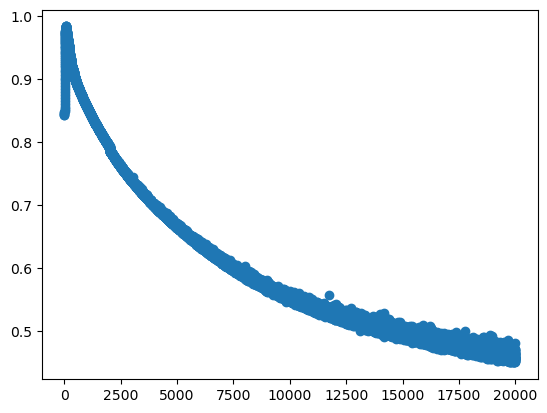

C:\Users\flang\AppData\Local\Temp\ipykernel_15008\3747954552.py:211: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


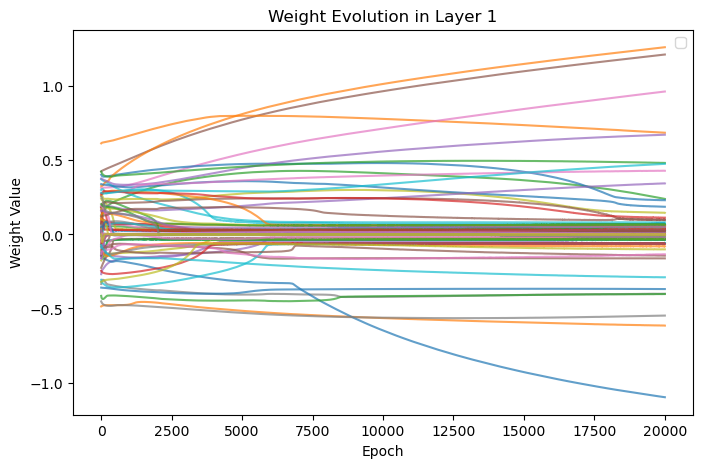

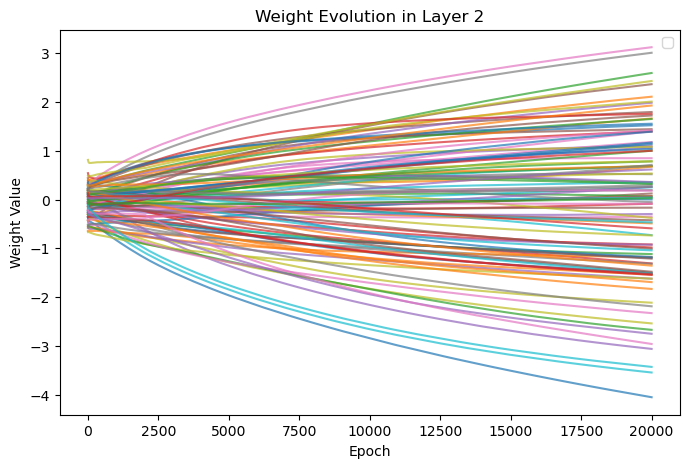

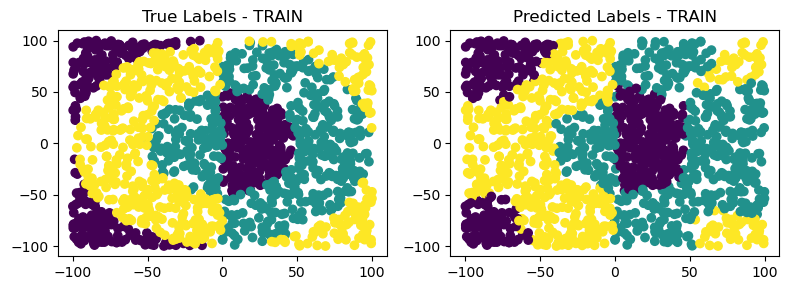

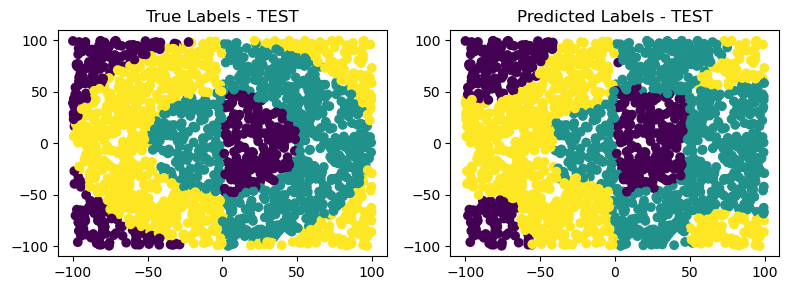

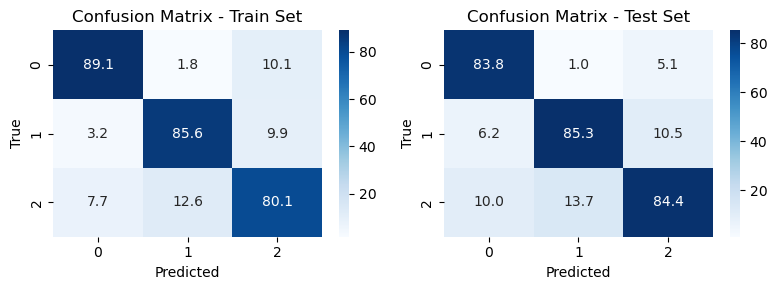

TRAIN F1-score: 0.8493075281519761
TEST F1-score: 0.848415716045949


In [11]:
np.random.seed(423)

rings3_regular_train = pd.read_csv('./data/classification/rings3-regular-training.csv')

X_train = rings3_regular_train.iloc[:, 0:(len(rings3_regular_train.iloc[1]) - 1)]
y_train = np.array(rings3_regular_train.iloc[:,-1])

rings3_regular_test = pd.read_csv('./data/classification/rings3-regular-test.csv')

X_test = rings3_regular_test.iloc[:, 0:(len(rings3_regular_test.iloc[1]) - 1)]
y_test = np.array(rings3_regular_test['c'])

NN = MLP(layers=[
    {'input_dim' : 2, 'output_dim' : 35, 'activation' : 'sigmoid'},
    {'input_dim' : 35, 'output_dim' : 3, 'activation' : 'sigmoid'}
], 
                   weights_init='xavier',
                   classification=True)

NN.train(X_train, y_train, epochs=20000, learning_rate=0.0004, batch_size = 30)

y_train_pred = NN.predict(X_train)

y_test_pred = NN.predict(X_test)

plt.figure(figsize=(8, 3))

plt.subplot(1, 2, 1)
plt.scatter(X_train.iloc[:, 0], X_train.iloc[:, 1], c=y_train)
plt.title("True Labels - TRAIN")

plt.subplot(1, 2, 2)
plt.scatter(X_train.iloc[:, 0], X_train.iloc[:, 1], c=y_train_pred)
plt.title("Predicted Labels - TRAIN")

plt.tight_layout()
plt.show()

plt.figure(figsize=(8, 3))

plt.subplot(1, 2, 1)
plt.scatter(X_test.iloc[:, 0], X_test.iloc[:, 1], c=y_test)
plt.title("True Labels - TEST")

plt.subplot(1, 2, 2)
plt.scatter(X_test.iloc[:, 0], X_test.iloc[:, 1], c=y_test_pred)
plt.title("Predicted Labels - TEST")

plt.tight_layout()
plt.show()


cm_train = confusion_matrix(y_train, y_train_pred, normalize='pred') * 100
cm_test = confusion_matrix(y_test, y_test_pred, normalize='pred') * 100

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8, 3))

sns.heatmap(cm_train, annot=True, fmt=".1f", cmap="Blues", 
            xticklabels=np.unique(y_train), yticklabels=np.unique(y_train), ax=ax1)
ax1.set_title("Confusion Matrix - Train Set")
ax1.set_xlabel("Predicted")
ax1.set_ylabel("True")

sns.heatmap(cm_test, annot=True, fmt=".1f", cmap="Blues", 
            xticklabels=np.unique(y_test), yticklabels=np.unique(y_test), ax=ax2)
ax2.set_title("Confusion Matrix - Test Set")
ax2.set_xlabel("Predicted")
ax2.set_ylabel("True")

plt.tight_layout()
plt.show()

print(f"TRAIN F1-score: {NN.f1_score(y_train, y_train_pred)}")
print(f"TEST F1-score: {NN.f1_score(y_test, y_test_pred)}")



## **easy dataset**


Epoch 1/8000. Loss = 4.410785033941765. F1 Score = 0.7655038060536095.

Epoch 2/8000. Loss = 4.279130019891771. F1 Score = 0.7715577357764632.

Epoch 3/8000. Loss = 4.149929641308682. F1 Score = 0.7813624529126935.

Epoch 4/8000. Loss = 4.012086855406571. F1 Score = 0.7813624529126935.

Epoch 5/8000. Loss = 3.8751948363782414. F1 Score = 0.7813624529126935.

Epoch 6/8000. Loss = 3.7368265380764387. F1 Score = 0.7854636591478696.

Epoch 7/8000. Loss = 3.6043988015330393. F1 Score = 0.7854636591478696.

Epoch 8/8000. Loss = 3.46331613057981. F1 Score = 0.791596530883791.

Epoch 9/8000. Loss = 3.3350007590538064. F1 Score = 0.7956042899052567.

Epoch 10/8000. Loss = 3.209652852026201. F1 Score = 0.7956042899052567.

Epoch 11/8000. Loss = 3.0940529347889347. F1 Score = 0.7975716616360218.

Epoch 12/8000. Loss = 2.9587764994827292. F1 Score = 0.8015801435838235.

Epoch 13/8000. Loss = 2.8108745224877185. F1 Score = 0.8036198079481878.

Epoch 14/8000. Loss = 2.649542953681073. F1 Score = 0.

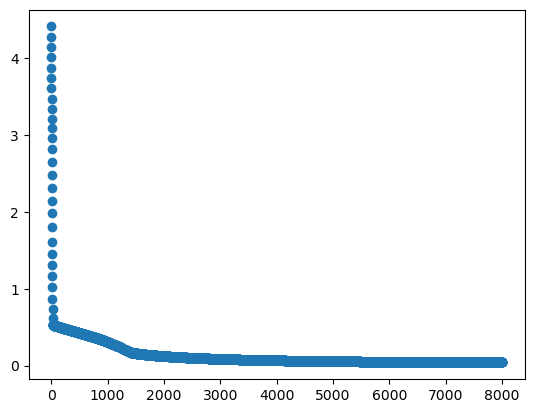

C:\Users\flang\AppData\Local\Temp\ipykernel_15008\3747954552.py:211: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


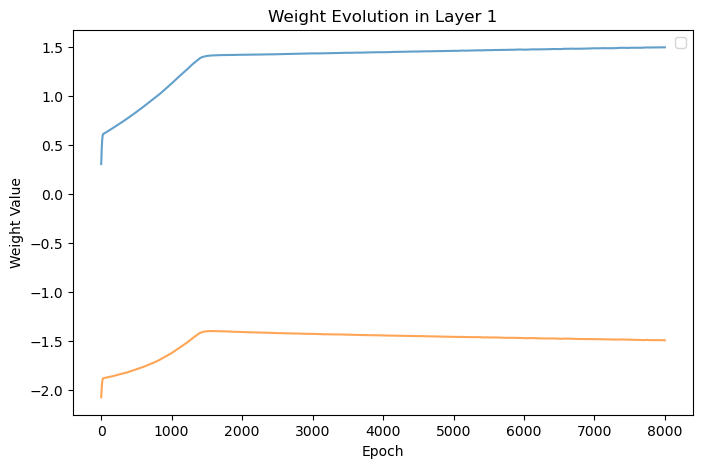

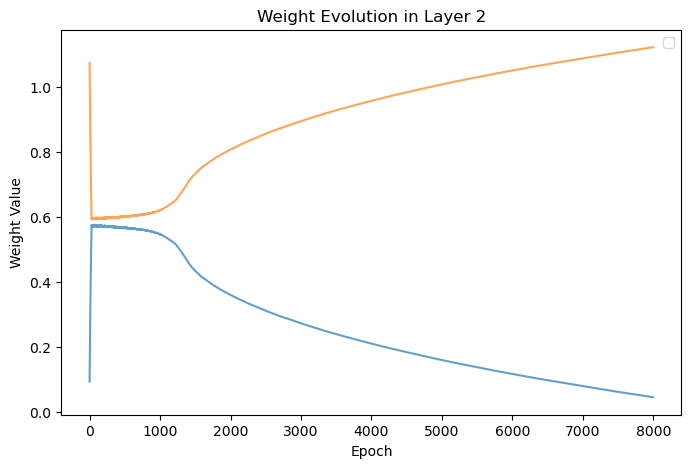

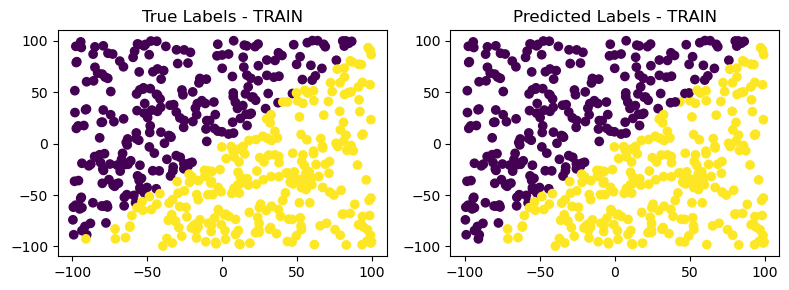

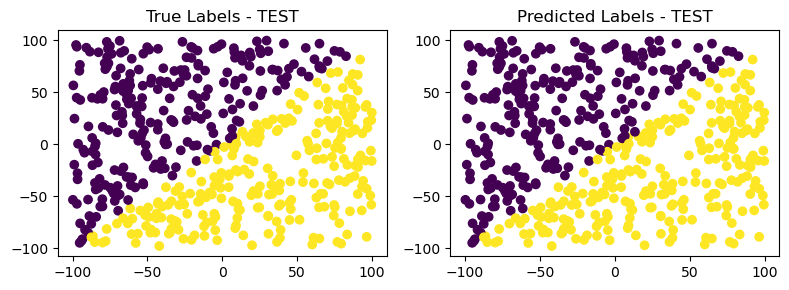

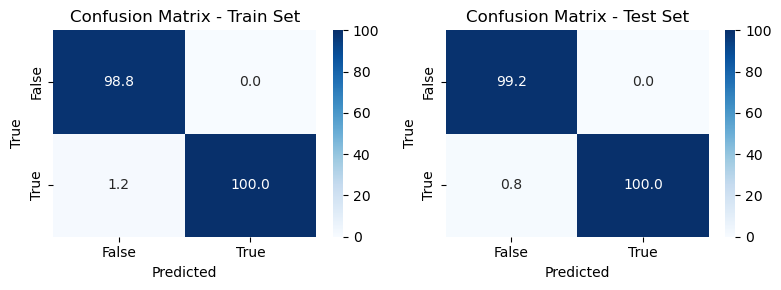

TRAIN F1-score: 0.9939997839922237
TEST F1-score: 0.995999935998976


In [12]:
np.random.seed(423)

easy_train = pd.read_csv('./data/classification/easy-training.csv')

X_train = easy_train.iloc[:, 0:(len(easy_train.iloc[1]) - 1)]
y_train = np.array(easy_train.iloc[:,-1])

easy_test = pd.read_csv('./data/classification/easy-test.csv')

X_test = easy_test.iloc[:, 0:(len(easy_test.iloc[1]) - 1)]
y_test = np.array(easy_test['c'])

NN = MLP(layers=[
    {'input_dim' : 2, 'output_dim' : 1, 'activation' : 'relu'},
    {'input_dim' : 1, 'output_dim' : 2, 'activation' : 'softmax'}
], 
                   weights_init='he',
                   classification=True)

NN.train(X_train, y_train, epochs=8000, learning_rate=0.001, batch_size = 200)

y_train_pred = NN.predict(X_train)

y_test_pred = NN.predict(X_test)

plt.figure(figsize=(8, 3))

plt.subplot(1, 2, 1)
plt.scatter(X_train.iloc[:, 0], X_train.iloc[:, 1], c=y_train)
plt.title("True Labels - TRAIN")

plt.subplot(1, 2, 2)
plt.scatter(X_train.iloc[:, 0], X_train.iloc[:, 1], c=y_train_pred)
plt.title("Predicted Labels - TRAIN")

plt.tight_layout()
plt.show()

plt.figure(figsize=(8, 3))

plt.subplot(1, 2, 1)
plt.scatter(X_test.iloc[:, 0], X_test.iloc[:, 1], c=y_test)
plt.title("True Labels - TEST")

plt.subplot(1, 2, 2)
plt.scatter(X_test.iloc[:, 0], X_test.iloc[:, 1], c=y_test_pred)
plt.title("Predicted Labels - TEST")

plt.tight_layout()
plt.show()


cm_train = confusion_matrix(y_train, y_train_pred, normalize='pred') * 100
cm_test = confusion_matrix(y_test, y_test_pred, normalize='pred') * 100

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8, 3))

sns.heatmap(cm_train, annot=True, fmt=".1f", cmap="Blues", 
            xticklabels=np.unique(y_train), yticklabels=np.unique(y_train), ax=ax1)
ax1.set_title("Confusion Matrix - Train Set")
ax1.set_xlabel("Predicted")
ax1.set_ylabel("True")

sns.heatmap(cm_test, annot=True, fmt=".1f", cmap="Blues", 
            xticklabels=np.unique(y_test), yticklabels=np.unique(y_test), ax=ax2)
ax2.set_title("Confusion Matrix - Test Set")
ax2.set_xlabel("Predicted")
ax2.set_ylabel("True")

plt.tight_layout()
plt.show()

print(f"TRAIN F1-score: {NN.f1_score(y_train, y_train_pred)}")
print(f"TEST F1-score: {NN.f1_score(y_test, y_test_pred)}")


## **easy dataset with sigmoid**


Epoch 1/8000. Loss = 0.5265182819322339. F1 Score = 0.769512288001411.

Epoch 2/8000. Loss = 0.4904164661078231. F1 Score = 0.7715577357764632.

Epoch 3/8000. Loss = 0.4739170404461903. F1 Score = 0.7813624529126935.

Epoch 4/8000. Loss = 0.47873716797262056. F1 Score = 0.7813624529126935.

Epoch 5/8000. Loss = 0.4753148245990384. F1 Score = 0.7854636591478696.

Epoch 6/8000. Loss = 0.46558982274222344. F1 Score = 0.7854636591478696.

Epoch 7/8000. Loss = 0.4754706102481558. F1 Score = 0.7935631796882203.

Epoch 8/8000. Loss = 0.4671570269152827. F1 Score = 0.7956042899052567.

Epoch 9/8000. Loss = 0.4652667047711443. F1 Score = 0.8015801435838235.

Epoch 10/8000. Loss = 0.45930274133222426. F1 Score = 0.8036198079481878.

Epoch 11/8000. Loss = 0.47219212336583305. F1 Score = 0.8036198079481878.

Epoch 12/8000. Loss = 0.4638425189282989. F1 Score = 0.8076923076923077.

Epoch 13/8000. Loss = 0.4676791743723056. F1 Score = 0.811756035822426.

Epoch 14/8000. Loss = 0.4625188814329258. F1

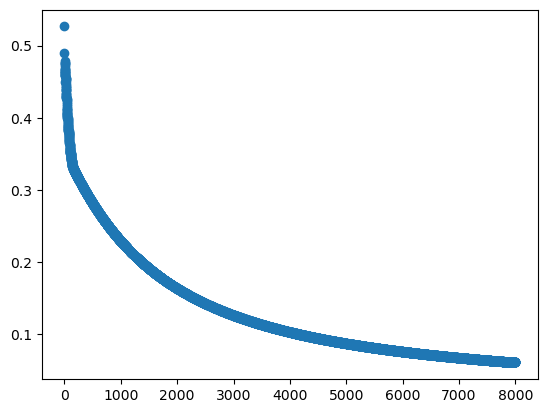

C:\Users\flang\AppData\Local\Temp\ipykernel_7636\3747954552.py:211: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


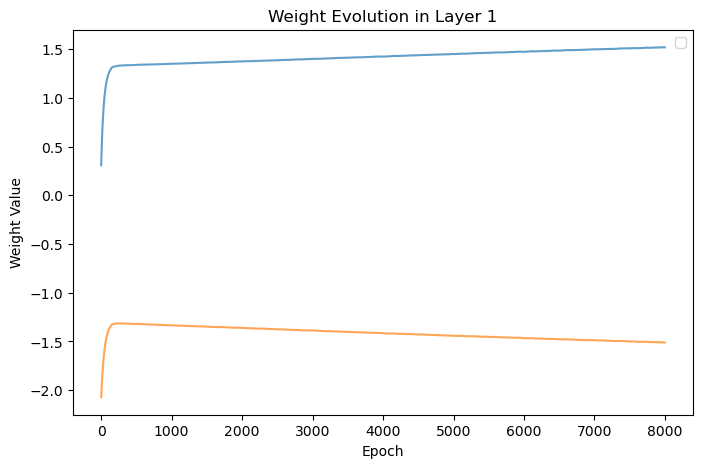

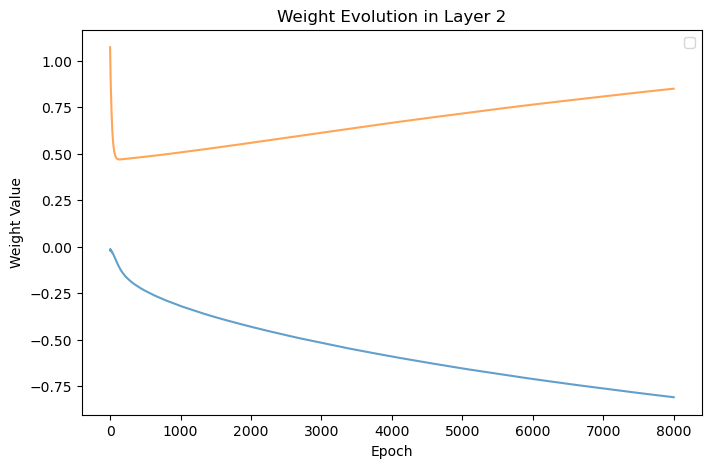

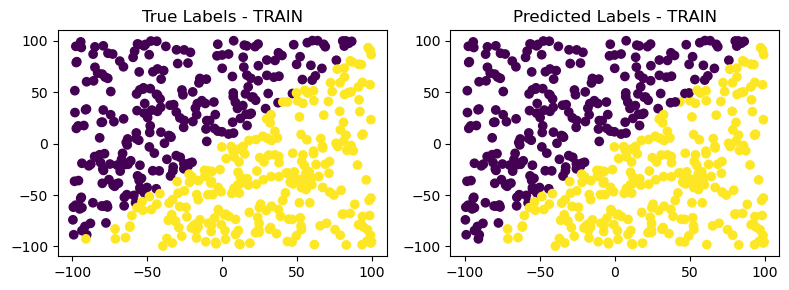

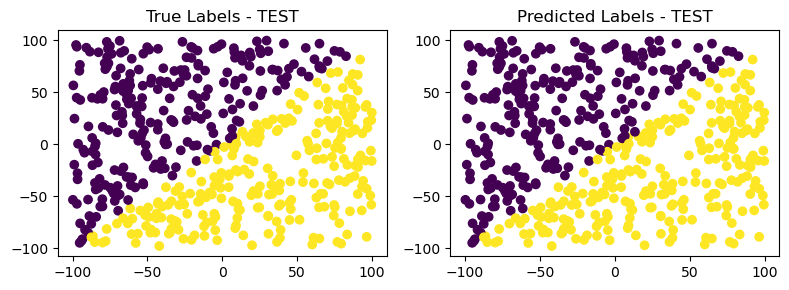

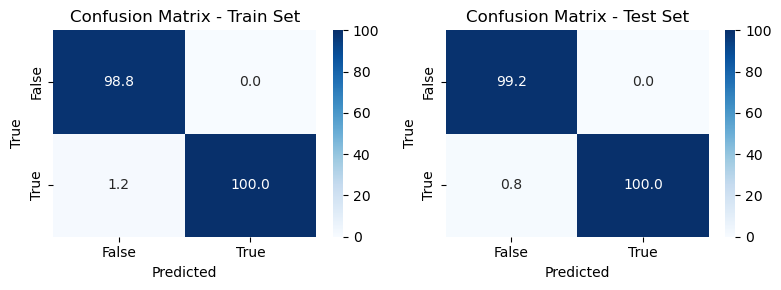

TRAIN F1-score: 0.9939997839922237
TEST F1-score: 0.995999935998976


In [33]:
np.random.seed(423)

easy_train = pd.read_csv('./data/classification/easy-training.csv')

X_train = easy_train.iloc[:, 0:(len(easy_train.iloc[1]) - 1)]
y_train = np.array(easy_train.iloc[:,-1])

easy_test = pd.read_csv('./data/classification/easy-test.csv')

X_test = easy_test.iloc[:, 0:(len(easy_test.iloc[1]) - 1)]
y_test = np.array(easy_test['c'])

NN = MLP(layers=[
    {'input_dim' : 2, 'output_dim' : 1, 'activation' : 'relu'},
    {'input_dim' : 1, 'output_dim' : 2, 'activation' : 'sigmoid'}
], 
                   weights_init='he',
                   classification=True)

NN.train(X_train, y_train, epochs=8000, learning_rate=0.001, batch_size = 200)

y_train_pred = NN.predict(X_train)

y_test_pred = NN.predict(X_test)

plt.figure(figsize=(8, 3))

plt.subplot(1, 2, 1)
plt.scatter(X_train.iloc[:, 0], X_train.iloc[:, 1], c=y_train)
plt.title("True Labels - TRAIN")

plt.subplot(1, 2, 2)
plt.scatter(X_train.iloc[:, 0], X_train.iloc[:, 1], c=y_train_pred)
plt.title("Predicted Labels - TRAIN")

plt.tight_layout()
plt.show()

plt.figure(figsize=(8, 3))

plt.subplot(1, 2, 1)
plt.scatter(X_test.iloc[:, 0], X_test.iloc[:, 1], c=y_test)
plt.title("True Labels - TEST")

plt.subplot(1, 2, 2)
plt.scatter(X_test.iloc[:, 0], X_test.iloc[:, 1], c=y_test_pred)
plt.title("Predicted Labels - TEST")

plt.tight_layout()
plt.show()


cm_train = confusion_matrix(y_train, y_train_pred, normalize='pred') * 100
cm_test = confusion_matrix(y_test, y_test_pred, normalize='pred') * 100

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8, 3))

sns.heatmap(cm_train, annot=True, fmt=".1f", cmap="Blues", 
            xticklabels=np.unique(y_train), yticklabels=np.unique(y_train), ax=ax1)
ax1.set_title("Confusion Matrix - Train Set")
ax1.set_xlabel("Predicted")
ax1.set_ylabel("True")

sns.heatmap(cm_test, annot=True, fmt=".1f", cmap="Blues", 
            xticklabels=np.unique(y_test), yticklabels=np.unique(y_test), ax=ax2)
ax2.set_title("Confusion Matrix - Test Set")
ax2.set_xlabel("Predicted")
ax2.set_ylabel("True")

plt.tight_layout()
plt.show()

print(f"TRAIN F1-score: {NN.f1_score(y_train, y_train_pred)}")
print(f"TEST F1-score: {NN.f1_score(y_test, y_test_pred)}")



## **xor3 dataset**


Epoch 1/10000. Loss = 0.8912204577881265. F1 Score = 0.45579422766567.

Epoch 2/10000. Loss = 0.8834243034078723. F1 Score = 0.45579422766567.

Epoch 3/10000. Loss = 0.8720164476736321. F1 Score = 0.45579422766567.

Epoch 4/10000. Loss = 0.8574167933707046. F1 Score = 0.45579422766567.

Epoch 5/10000. Loss = 0.8402690537549751. F1 Score = 0.45579422766567.

Epoch 6/10000. Loss = 0.8213638921934575. F1 Score = 0.45579422766567.

Epoch 7/10000. Loss = 0.8014143533285887. F1 Score = 0.46502691518282757.

Epoch 8/10000. Loss = 0.7808792916553895. F1 Score = 0.4700549895881392.

Epoch 9/10000. Loss = 0.7600451775565527. F1 Score = 0.477533960292581.

Epoch 10/10000. Loss = 0.7392928857355338. F1 Score = 0.49227263721022396.

Epoch 11/10000. Loss = 0.7193243610405382. F1 Score = 0.49335204033492097.

Epoch 12/10000. Loss = 0.7011257192472805. F1 Score = 0.4975078832265283.

Epoch 13/10000. Loss = 0.6855553320246697. F1 Score = 0.4975604440839255.

Epoch 14/10000. Loss = 0.6726982460065601. 

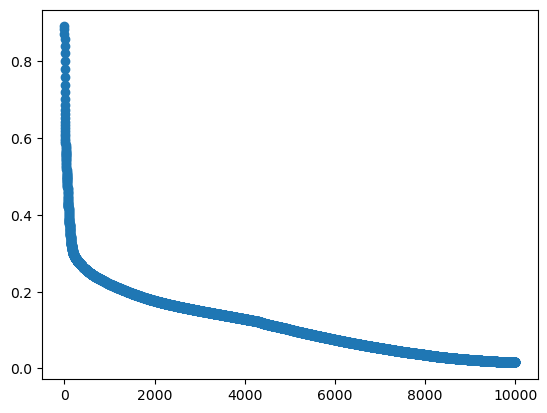

C:\Users\flang\AppData\Local\Temp\ipykernel_15008\2402583424.py:209: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


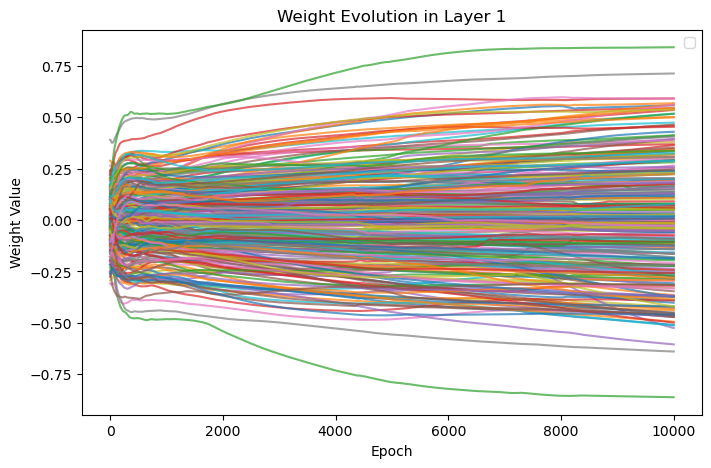

c:\Users\flang\anaconda3\envs\miowad\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


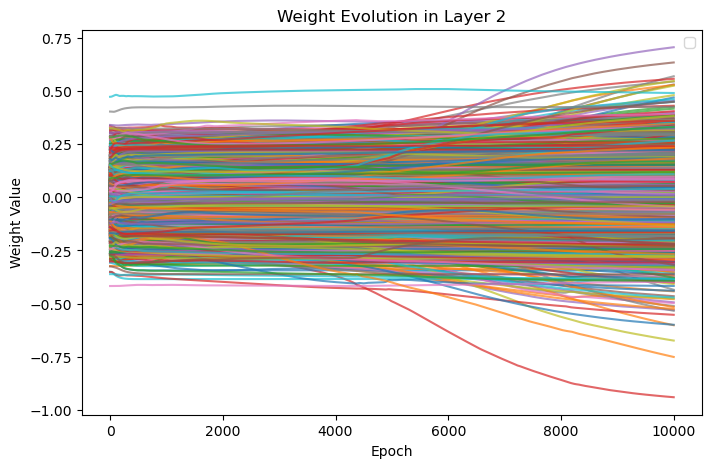

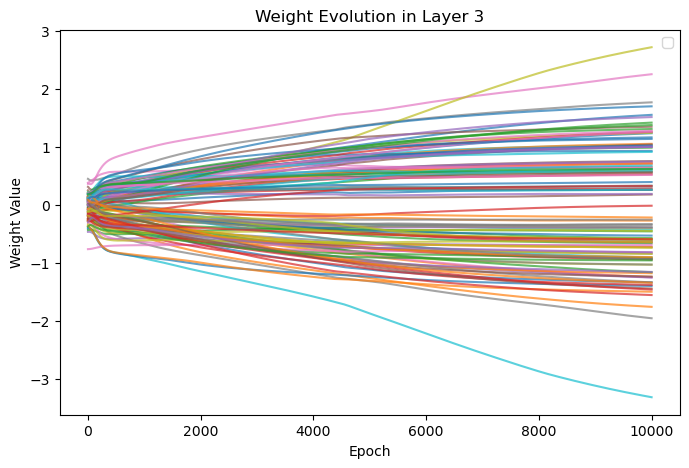

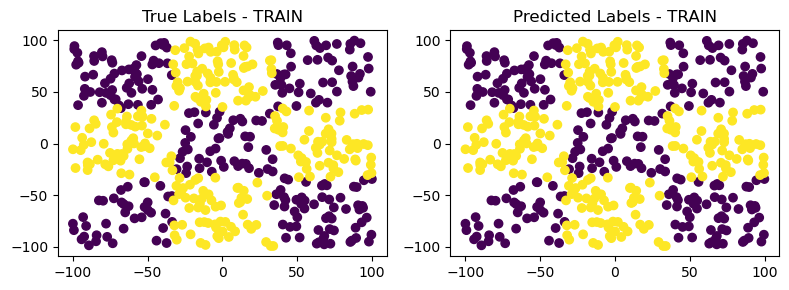

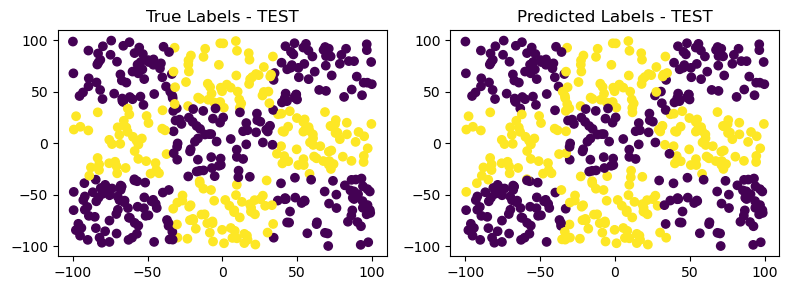

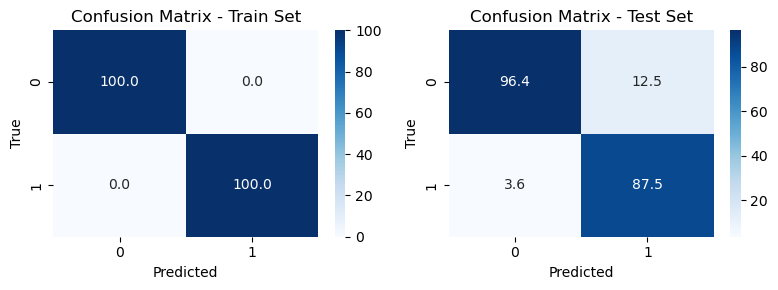

TRAIN F1-score: 1.0
TEST F1-score: 0.9224806201550387


In [24]:
np.random.seed(23)

xor3_train = pd.read_csv('./data/classification/xor3-training.csv')

X_train = xor3_train.iloc[:, 0:(len(xor3_train.iloc[1]) - 1)]
y_train = np.array(xor3_train.iloc[:,-1])

xor3_test = pd.read_csv('./data/classification/xor3-test.csv')

X_test = xor3_test.iloc[:, 0:(len(xor3_test.iloc[1]) - 1)]
y_test = np.array(xor3_test['c'])

NN = MLP(layers=[
    {'input_dim' : 2, 'output_dim' : 131, 'activation' : 'relu'},
    {'input_dim' : 131, 'output_dim' : 57, 'activation' : 'sigmoid'},
    {'input_dim' : 57, 'output_dim' : 2, 'activation' : 'softmax'}
], 
                   weights_init='xavier',
                   classification=True)

NN.train(X_train, y_train, epochs=10000, learning_rate=0.001, batch_size = None, optimizer='momentum', beta = 0.99)

y_train_pred = NN.predict(X_train)

y_test_pred = NN.predict(X_test)

plt.figure(figsize=(8, 3))

plt.subplot(1, 2, 1)
plt.scatter(X_train.iloc[:, 0], X_train.iloc[:, 1], c=y_train)
plt.title("True Labels - TRAIN")

plt.subplot(1, 2, 2)
plt.scatter(X_train.iloc[:, 0], X_train.iloc[:, 1], c=y_train_pred)
plt.title("Predicted Labels - TRAIN")

plt.tight_layout()
plt.show()

plt.figure(figsize=(8, 3))

plt.subplot(1, 2, 1)
plt.scatter(X_test.iloc[:, 0], X_test.iloc[:, 1], c=y_test)
plt.title("True Labels - TEST")

plt.subplot(1, 2, 2)
plt.scatter(X_test.iloc[:, 0], X_test.iloc[:, 1], c=y_test_pred)
plt.title("Predicted Labels - TEST")

plt.tight_layout()
plt.show()


cm_train = confusion_matrix(y_train, y_train_pred, normalize='pred') * 100
cm_test = confusion_matrix(y_test, y_test_pred, normalize='pred') * 100

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8, 3))

sns.heatmap(cm_train, annot=True, fmt=".1f", cmap="Blues", 
            xticklabels=np.unique(y_train), yticklabels=np.unique(y_train), ax=ax1)
ax1.set_title("Confusion Matrix - Train Set")
ax1.set_xlabel("Predicted")
ax1.set_ylabel("True")

sns.heatmap(cm_test, annot=True, fmt=".1f", cmap="Blues", 
            xticklabels=np.unique(y_test), yticklabels=np.unique(y_test), ax=ax2)
ax2.set_title("Confusion Matrix - Test Set")
ax2.set_xlabel("Predicted")
ax2.set_ylabel("True")

plt.tight_layout()
plt.show()

print(f"TRAIN F1-score: {NN.f1_score(y_train, y_train_pred)}")
print(f"TEST F1-score: {NN.f1_score(y_test, y_test_pred)}")



## **xor3 dataset with sigmoid**


Epoch 1/10000. Loss = 0.603436394183031. F1 Score = 0.45579422766567.

Epoch 2/10000. Loss = 0.6025900461868783. F1 Score = 0.45579422766567.

Epoch 3/10000. Loss = 0.601372993208756. F1 Score = 0.45579422766567.

Epoch 4/10000. Loss = 0.5998630863875919. F1 Score = 0.45579422766567.

Epoch 5/10000. Loss = 0.598191394624213. F1 Score = 0.45741999031703373.

Epoch 6/10000. Loss = 0.596537039782453. F1 Score = 0.45741999031703373.

Epoch 7/10000. Loss = 0.5951088979815908. F1 Score = 0.4590439907933047.

Epoch 8/10000. Loss = 0.5940835405318434. F1 Score = 0.4622868500889214.

Epoch 9/10000. Loss = 0.5935596057732544. F1 Score = 0.4639057814410883.

Epoch 10/10000. Loss = 0.5936038617739741. F1 Score = 0.46647138822052514.

Epoch 11/10000. Loss = 0.5942552082992483. F1 Score = 0.46971507141030644.

Epoch 12/10000. Loss = 0.5956164034980709. F1 Score = 0.46971507141030644.

Epoch 13/10000. Loss = 0.597853456224437. F1 Score = 0.46971507141030644.

Epoch 14/10000. Loss = 0.601053662801533

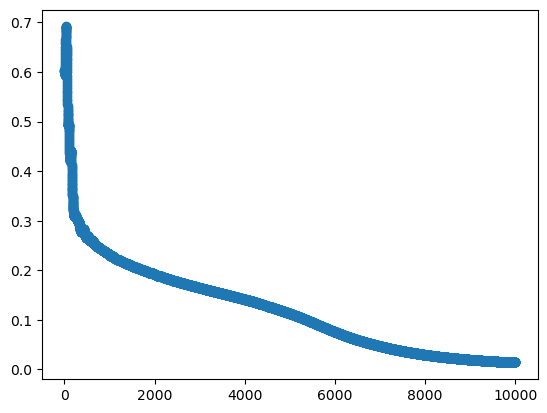

C:\Users\flang\AppData\Local\Temp\ipykernel_15008\3747954552.py:211: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()
c:\Users\flang\anaconda3\envs\miowad\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


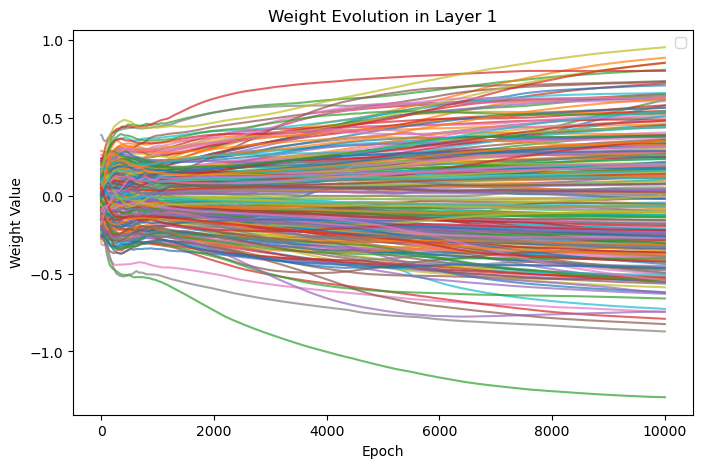

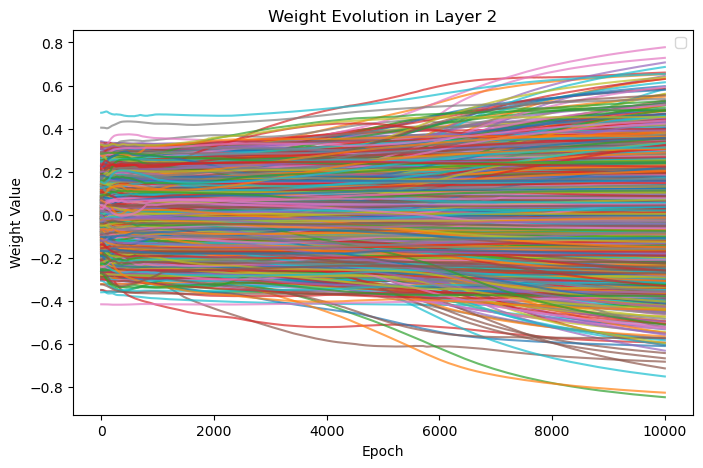

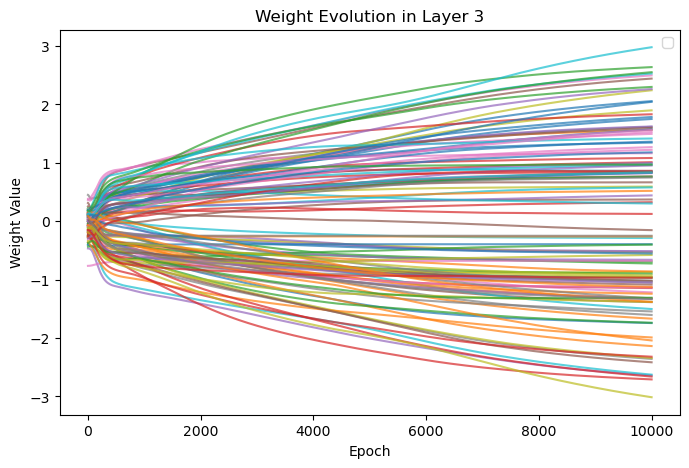

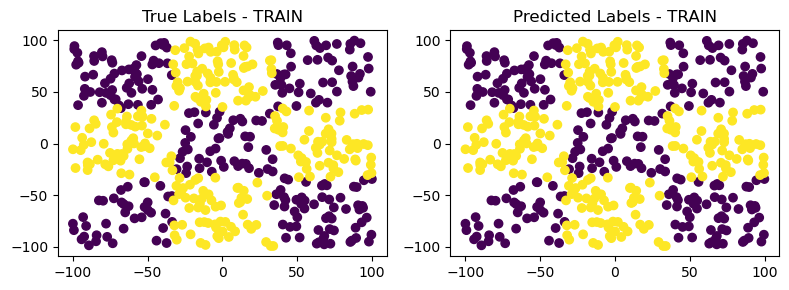

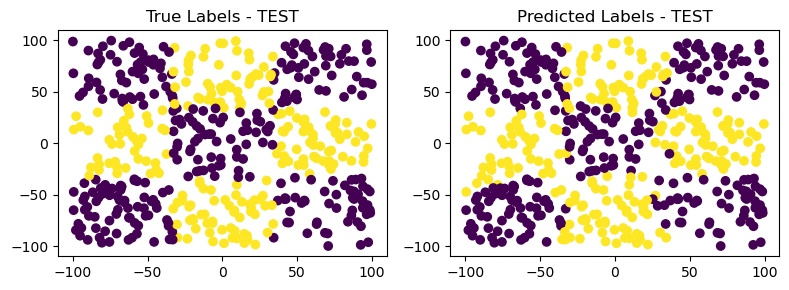

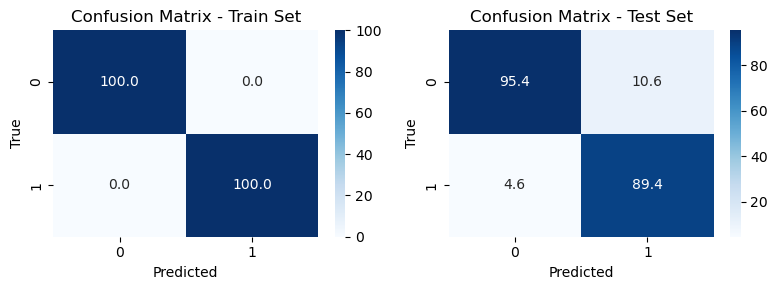

TRAIN F1-score: 1.0
TEST F1-score: 0.9262041030518703


In [15]:
np.random.seed(23)

xor3_train = pd.read_csv('./data/classification/xor3-training.csv')

X_train = xor3_train.iloc[:, 0:(len(xor3_train.iloc[1]) - 1)]
y_train = np.array(xor3_train.iloc[:,-1])

xor3_test = pd.read_csv('./data/classification/xor3-test.csv')

X_test = xor3_test.iloc[:, 0:(len(xor3_test.iloc[1]) - 1)]
y_test = np.array(xor3_test['c'])

NN = MLP(layers=[
    {'input_dim' : 2, 'output_dim' : 131, 'activation' : 'relu'},
    {'input_dim' : 131, 'output_dim' : 57, 'activation' : 'sigmoid'},
    {'input_dim' : 57, 'output_dim' : 2, 'activation' : 'sigmoid'}
], 
                   weights_init='xavier',
                   classification=True)

NN.train(X_train, y_train, epochs=10000, learning_rate=0.001, batch_size = None, optimizer='momentum', beta = 0.99)

y_train_pred = NN.predict(X_train)

y_test_pred = NN.predict(X_test)

plt.figure(figsize=(8, 3))

plt.subplot(1, 2, 1)
plt.scatter(X_train.iloc[:, 0], X_train.iloc[:, 1], c=y_train)
plt.title("True Labels - TRAIN")

plt.subplot(1, 2, 2)
plt.scatter(X_train.iloc[:, 0], X_train.iloc[:, 1], c=y_train_pred)
plt.title("Predicted Labels - TRAIN")

plt.tight_layout()
plt.show()

plt.figure(figsize=(8, 3))

plt.subplot(1, 2, 1)
plt.scatter(X_test.iloc[:, 0], X_test.iloc[:, 1], c=y_test)
plt.title("True Labels - TEST")

plt.subplot(1, 2, 2)
plt.scatter(X_test.iloc[:, 0], X_test.iloc[:, 1], c=y_test_pred)
plt.title("Predicted Labels - TEST")

plt.tight_layout()
plt.show()


cm_train = confusion_matrix(y_train, y_train_pred, normalize='pred') * 100
cm_test = confusion_matrix(y_test, y_test_pred, normalize='pred') * 100

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8, 3))

sns.heatmap(cm_train, annot=True, fmt=".1f", cmap="Blues", 
            xticklabels=np.unique(y_train), yticklabels=np.unique(y_train), ax=ax1)
ax1.set_title("Confusion Matrix - Train Set")
ax1.set_xlabel("Predicted")
ax1.set_ylabel("True")

sns.heatmap(cm_test, annot=True, fmt=".1f", cmap="Blues", 
            xticklabels=np.unique(y_test), yticklabels=np.unique(y_test), ax=ax2)
ax2.set_title("Confusion Matrix - Test Set")
ax2.set_xlabel("Predicted")
ax2.set_ylabel("True")

plt.tight_layout()
plt.show()

print(f"TRAIN F1-score: {NN.f1_score(y_train, y_train_pred)}")
print(f"TEST F1-score: {NN.f1_score(y_test, y_test_pred)}")



As we can see, the network with softmax converges faster and more smoothly.